In [1]:
%load_ext autoreload
%autoreload 2
%matplotlib inline
%cd ../../..

/Users/dave/Library/CloudStorage/OneDrive-PolitecnicodiMilano/PhD/Repositories/DT-rse


## Evaluate Experiment Results

In this notebook, we test the adaptation phase of the OL routine with an offline dataset generated by the estimation routine. The idea is to validate the method and create a new faulty cluster from the outlier set.

In [2]:
import pandas as pd
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import os
import seaborn as sns
from pathlib import Path
from scipy import signal
import plotly.graph_objects as go
from IPython.display import display, clear_output
import time

from ernesto.postprocessing.visualization import ernesto_plotter
from ernesto.adaptation.regime_shift.stats import *

In [203]:
folder = "data/output/adaptive/"
#folder = folder + 'region_shift_experiment/test_complete_routine/salto40-10_ks001/'
#folder = folder + 'region_multiple_shift_experiment/test_complete_routine/salto40-10-25-0_ks001_minoutliers30/'
#folder = folder + 'region_shift_experiment/test_complete_routine/validation_minOutliers10_batch6000/'
folder = folder + 'region_shift_experiment/test_complete_routine_with_noise/SNR40_batch3000/'
path = Path(folder)

In [204]:
samples_file = 'parameter_evolution.csv'
ground_file = 'ground_0.csv'
sim_datasets = [f for f in os.listdir(path) if f.startswith('dataset')]
clust_files = [f for f in os.listdir(path) if f.startswith('cluster')]

df_samples = pd.read_csv(path / samples_file)
df_ground = pd.read_csv(path / ground_file)
sorted(sim_datasets)
df_sim = pd.concat((pd.read_csv(path / f) for f in sorted(sim_datasets)), ignore_index=True)
dfs_clusters = {clust_file.split('cluster_')[1].split('.')[0]: pd.read_csv(path / clust_file) for clust_file in clust_files}

#dfs_clusters['nominal'] = dfs_clusters.pop('cluster_nominal_temp_40.csv')
#dfs_clusters['faulty1'] = dfs_clusters.pop('cluster_faulty_1.csv')

In [205]:
folder_fixed = "data/output/adaptive/"
#folder_fixed = folder_fixed + 'region_shift_experiment/test_complete_routine/fixed_params/'
#folder_fixed = folder_fixed + 'region_multiple_shift_experiment/test_complete_routine/fixed_params/'
#folder_fixed = folder_fixed + 'region_shift_experiment/test_complete_routine/validation_fixed_params/'
folder_fixed = folder_fixed + 'region_shift_experiment/test_complete_routine/validation_real_params/'
path_fixed = Path(folder_fixed)

In [206]:
fixed_datasets = [f for f in os.listdir(path_fixed) if f.startswith('dataset')]
sorted(fixed_datasets)
df_fixed = pd.concat((pd.read_csv(path_fixed / f) for f in sorted(fixed_datasets)), ignore_index=True)

In [207]:
df_samples

,soc,temperature,r0,r1,c1,cluster,is_outlier,time,active_cluster
0,1.000000,303.150000,0.002198,0.002480,22966.778613,nominal_temp_40,False,0,nominal_temp_40
1,0.800000,303.150000,0.002238,0.002910,24140.464793,nominal_temp_40,False,0,nominal_temp_40
2,0.600000,303.150000,0.002271,0.002205,20859.505625,nominal_temp_40,False,0,nominal_temp_40
3,0.500000,303.150000,0.002291,0.002436,22622.611802,nominal_temp_40,False,0,nominal_temp_40
4,0.400000,303.150000,0.002308,0.002862,26234.314231,nominal_temp_40,False,0,nominal_temp_40
...,...,...,...,...,...,...,...,...,...
509,0.604167,283.198451,0.003547,0.004870,11077.742086,faulty_1,False,496,faulty_1
510,0.604167,283.198454,0.003652,0.004852,12239.841225,faulty_1,False,497,faulty_1
511,0.604167,283.198458,0.003754,0.004662,12763.285591,faulty_1,False,498,faulty_1
512,0.604167,283.198461,0.003664,0.004811,12223.096784,faulty_1,False,499,faulty_1


In [208]:
df_fixed

,time,soc,soh,c_max,voltage,current,power,v_oc,r0,r1,c1,v_r0,v_rc,i_r1,i_c,temperature,heat,t_amb,dVoc_dT
0,-1,0.500000,1.0,20.0,3.742600,0.0000,0.000000,0.000000,0.001834,0.002070,26290.432975,0.000000,0.000000,0.000000,0.000000,313.150000,0.000000,313.2103,-0.000168
1,0,0.499722,1.0,20.0,3.667803,19.9866,-73.306908,3.705200,0.001834,0.002070,26290.432975,0.036651,0.000747,0.360716,19.625884,313.156145,0.732792,313.2103,-0.000168
2,1,0.499445,1.0,20.0,3.667086,19.9778,-73.260316,3.705200,0.001834,0.002070,26290.432975,0.036635,0.001479,0.714764,19.263036,313.158787,0.732935,313.1658,-0.000167
3,2,0.499167,1.0,20.0,3.666367,19.9778,-73.245942,3.705200,0.001834,0.002070,26290.432975,0.036635,0.002199,1.062421,18.915379,313.160689,0.734213,313.1578,-0.000166
4,3,0.498890,1.0,20.0,3.665660,19.9778,-73.231828,3.705200,0.001834,0.002070,26290.432975,0.036635,0.002905,1.403805,18.573995,313.164701,0.735956,313.1903,-0.000165
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
899995,899994,0.147206,1.0,20.0,3.240042,19.9787,-64.731824,3.552340,0.004022,0.013203,3404.976823,0.080354,0.231944,17.568077,2.410623,283.727963,5.680189,283.6886,-0.000013
899996,899995,0.146929,1.0,20.0,3.239173,19.9786,-64.714146,3.552167,0.004021,0.013233,3391.170889,0.080343,0.232651,17.581739,2.396861,283.730330,5.695545,283.6694,-0.000013
899997,899996,0.146651,1.0,20.0,3.238301,19.9786,-64.696722,3.551993,0.004021,0.013265,3376.398093,0.080334,0.233358,17.592172,2.386428,283.732883,5.710238,283.6742,-0.000014
899998,899997,0.146374,1.0,20.0,3.237429,19.9786,-64.679307,3.551819,0.004021,0.013297,3361.738309,0.080325,0.234065,17.602916,2.375684,283.733039,5.725010,283.6418,-0.000014


In [209]:
comparison_params = {
    'dfs': [df_ground[1:], df_sim[1:]],# df_fixed[1:]], 
    'variables': ['temperature', 'voltage'], #'r0', 'r1', 'c1', 'current'], 
    'x_axes': ['time'] * 10,
    'labels': ['Ground', 'Adaptive', 'Fixed'],
    'x_labels': ['Time [s]'] * 10,
    'y_labels': [' Temperature [K]', 'Voltage [V]', r'$R_0 [\Omega]$', r'$R_1 [\Omega]$', '$C_1 [Ah]$', 'Current [A]'],
    'markers': [''] * 10,
    'line_styles': ['-'] * 10,
    'save_fig': False,
    'sampling_rate': 10000,
    #'colors': ['#648FFF', '#785EF0', '#DC267F', '#FE6100', '#FFB000'],
    'plot_type': 'line',
    'dest': path, 
    'fig_name': 'pv_test',
    'pic_format': 'pdf',
    'save_extend_bbox': (1.5,1.5),
    'figsize': (12, 4),
    'tick_font_size': 20,
    'label_font_size': 22,
    'legend_font_size': 18,
    'alphas':[1] * 5
}

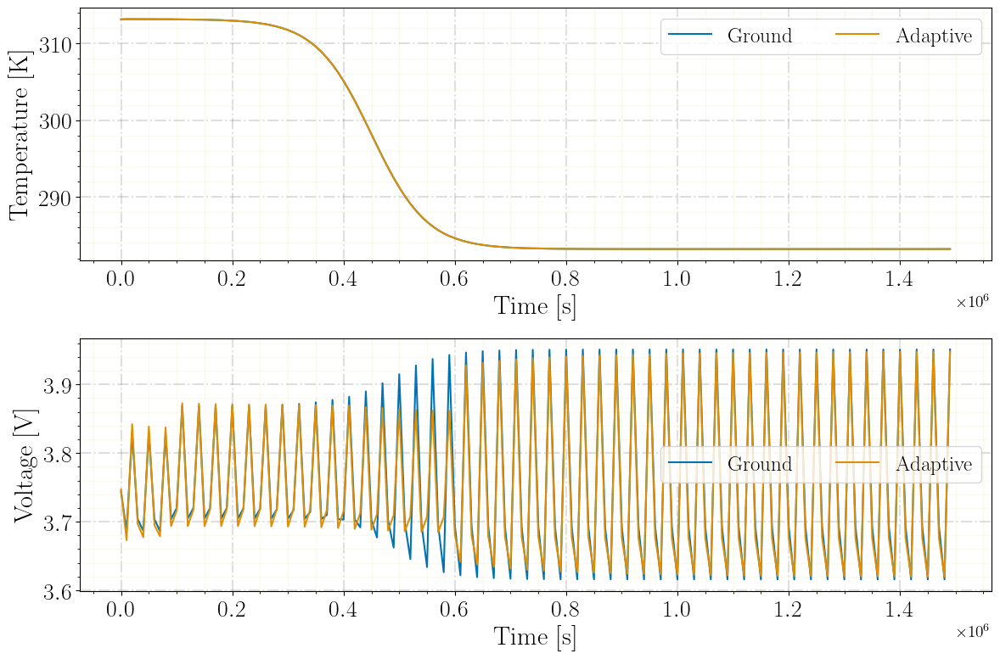

In [210]:
ernesto_plotter(**comparison_params)

In [211]:
# Adding sensor noise to voltage
rng = np.random.default_rng(seed=123)

snr_db = 50
rms = np.sqrt(np.mean(df_ground['voltage']**2))
sigma_from_snr = rms / (10**(snr_db/20))
v_noisy2 = df_ground['voltage'] + rng.normal(0, sigma_from_snr, size=df_ground['voltage'].shape)
print(sigma_from_snr)

0.011915630190663218


<Axes: >

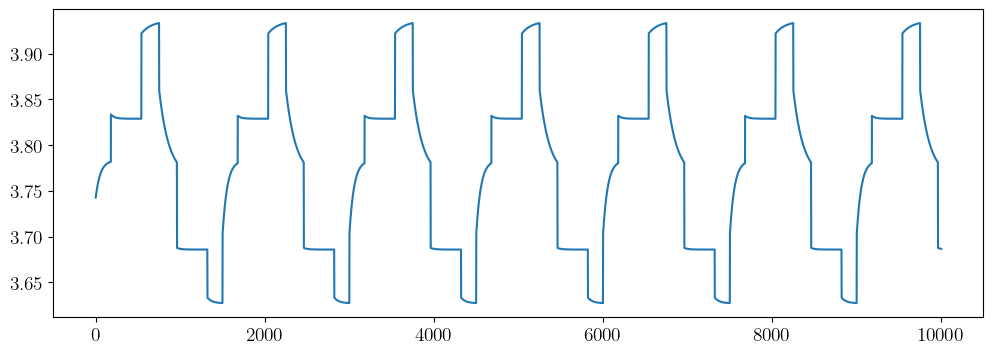

In [212]:
df_ground['voltage'][:10000].plot(figsize=(12,4))

<Axes: >

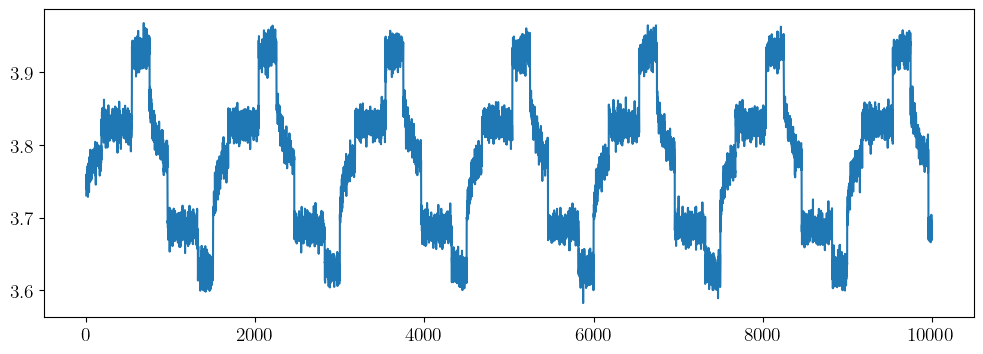

In [213]:
v_noisy2[:10000].plot(figsize=(12,4))

In [214]:
Verr_adaptive = (df_ground['voltage'].values - df_sim['voltage'].values[1:])**2 / len(df_ground)
Verr_fixed = (df_ground['voltage'].values - df_fixed['voltage'].values[1:])**2 / len(df_ground)

ValueError: operands could not be broadcast together with shapes (1499998,) (899999,) 

ValueError: 'x' has size 1499998, but 'y1' has an unequal size of 899999

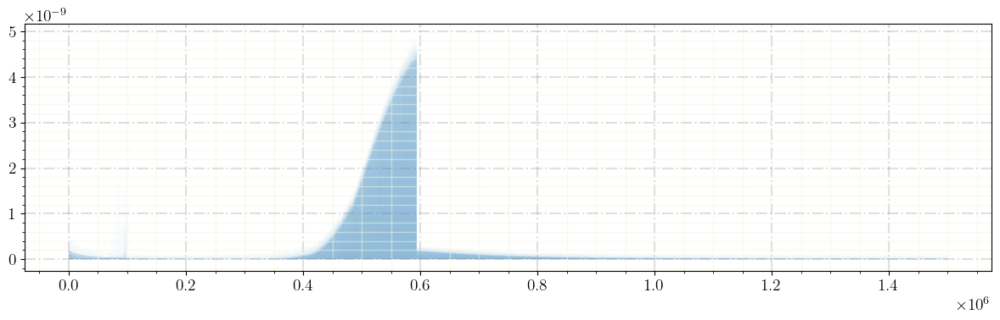

In [131]:
fig, ax = plt.subplots(figsize=(12, 4), tight_layout=True)

matplotlib.rcParams.update({
    "text.usetex" : True,
    "text.latex.preamble": r'\usepackage{amsmath} \usepackage{amssymb}',
    "font.family": "serif",
    "font.serif" : ["Computer Modern Serif"],
    "font.size" : 14
})
                       
ax.grid(visible=True, which='major', color='gray', alpha=0.25, linestyle='dashdot', lw=1.5)
ax.minorticks_on()
ax.grid(visible=True, which='minor', color='beige', alpha=0.5, ls='-', lw=1)


ax.fill_between(df_ground['time'], Verr_adaptive, [0]*len(df_ground), label='Adaptive', alpha=0.5)
ax.fill_between(df_ground['time'], Verr_fixed, [0]*len(df_ground), label='Fixed', alpha=0.5)

ax.set_title("Error on Voltage")
ax.legend()
plt.show()

ValueError: 'x' has size 1499998, but 'y1' has an unequal size of 899999

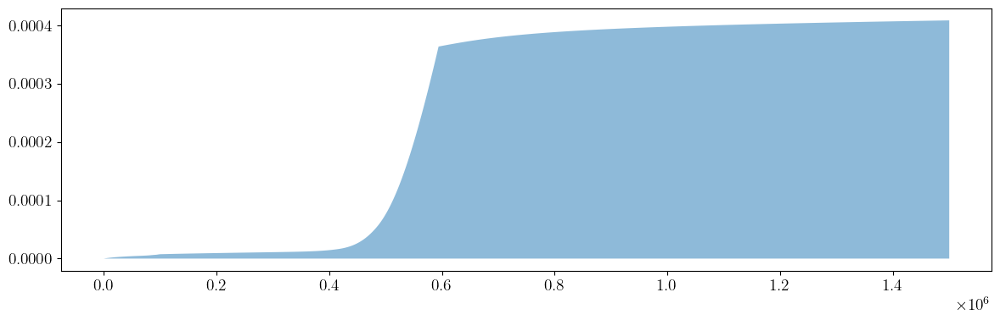

In [132]:
fig, ax = plt.subplots(figsize=(12, 4), tight_layout=True)

ax.fill_between(df_ground['time'], np.cumsum(Verr_adaptive), [0]*len(df_ground), label='Adaptive', alpha=0.5)
ax.fill_between(df_ground['time'], np.cumsum(Verr_fixed), [0]*len(df_ground), label='Fixed', alpha=0.5)

ax.set_title("Cumulative Error on Voltage")
ax.legend()
plt.show()

## Plotting the evolution of parameters

In [ ]:
import pandas as pd
import plotly.graph_objects as go
from IPython.display import display, clear_output
import time

def interactive_plot3d(X: pd.DataFrame, 
                       params: list, 
                       nominal: pd.DataFrame, 
                       faulty_clusters: list,
                       sleep_time: float = 0.2):
    """
    Animate the evolution of 3D samples vs nominal and faulty clusters.
    """
    # --- Create initial figure ---
    fig = go.Figure()

    fig.update_layout(
        title="Adaptive Clustering Evolution",
        scene=dict(
            xaxis_title=params[0],
            yaxis_title=params[1],
            zaxis_title=params[2],
        ),
        showlegend=True,
    )
    
    # Plot nominal cluster (blue)
    fig.add_trace(go.Scatter3d(
        x=X[X['time'] == 0][params[0]],
        y=X[X['time'] == 0][params[1]],
        z=X[X['time'] == 0][params[2]],
        mode='markers',
        marker=dict(size=3, color='blue', opacity=0.5),
        name='Nominal Cluster'
    ))

    fig.add_trace(go.Scatter3d(
        x=[None], y=[None], z=[None],
        mode='markers',
        marker=dict(size=3, color='red', opacity=0.5),
        name=f'Outliers'
    ))
    
    # Plot faulty clusters (orange/red tones)
    colors = ['red', 'orange', 'purple', 'brown']
    for i, fc in enumerate(faulty_clusters):
        fig.add_trace(go.Scatter3d(
            x=[None], y=[None], z=[None],
            mode='markers',
            marker=dict(size=3, color=colors[i % len(colors)], opacity=0.5),
            name=f'Faulty Cluster {i+1}'
        ))

    # Add initial "current sample" marker
    #fig.add_trace(go.Scatter3d(
    #    x=[None], y=[None], z=[None],
    #    mode='markers',
    #    marker=dict(size=4, color='black', symbol='x'),
    #    name='Current Sample'
    #))

    display(fig)

    # --- Iterate over samples ---
    for i in range(len(X)):
        x = X.iloc[i]
        cluster_name = x.get('cluster', '')

        if pd.notna(cluster_name) and cluster_name.startswith('nominal'):
            fig.data[0].x += (x[params[0]], )
            fig.data[0].y += (x[params[1]], )
            fig.data[0].z += (x[params[2]], )
        else:
            fig.data[1].x += (x[params[0]], )
            fig.data[1].y += (x[params[1]], )
            fig.data[1].z += (x[params[2]], )
            
        # Update the "Current Sample" trace (last one)
        fig.data[-1].x = [x[params[0]]]
        fig.data[-1].y = [x[params[1]]]
        fig.data[-1].z = [x[params[2]]]

        # Optionally, change color if it's faulty vs nominal
        # fig.data[-1].marker.color = 'black' if pd.notna(cluster_name) and cluster_name.startswith('nominal') else 'red'

        clear_output(wait=True)
        display(fig)
        time.sleep(sleep_time)


In [ ]:
#interactive_plot3d(
#    X=df_samples,
#    params=["r0", "r1", "c1"],
#    nominal=dfs_clusters['nominal'],
#    faulty_clusters=[df for key, df in dfs_clusters.items() if key.startswith('faulty')]
#)

In [191]:
import pandas as pd
import numpy as np
import plotly.graph_objects as go

def animated_plot3d(X: pd.DataFrame, 
                    params: list, 
                    original: pd.DataFrame, 
                    faulty_clusters: dict):
    """
    Animated 3D visualization of adaptive clustering over time.
    Shows nominal and faulty clusters statically, and samples evolving dynamically.
    """    
    # Extract parameters for readability
    x_col, y_col, z_col = params

    # --- Base static traces ---
    traces = []

    # Nominal cluster (blue)
    traces.append(go.Scatter3d(
        x=original[x_col],
        y=original[y_col],
        z=original[z_col],
        mode='markers',
        marker=dict(size=3, color='blue', opacity=0.5),
        name='Nominal Cluster'
    ))
    
    # Inliers
    inliers = X[(X['is_outlier'] == False) & (X['active_cluster'] == 'nominal_temp_40')]
    traces.append(go.Scatter3d(
        x=inliers[x_col],
        y=inliers[y_col],
        z=inliers[z_col],
        mode='markers',
        marker=dict(size=3, color='blue', opacity=0.5),
        name='Inliers'
    ))

    # Outliers
    faulty_times = []
    for key, clu in faulty_clusters.items():
        faulty_times.extend(clu['time'])
    
    outliers = X[(X['is_outlier'] == True) & (~X['time'].isin(faulty_times))]
    traces.append(go.Scatter3d(
        x=outliers[x_col],
        y=outliers[y_col],
        z=outliers[z_col],
        mode='markers',
        marker=dict(size=3, color='red', opacity=0.5),
        name='Outliers'
    ))
    
    # Faulty clusters (red/orange/purple)
    colors = ['green', 'orange', 'purple', 'violet', 'grey']
    for i, (k, fc) in enumerate(faulty_clusters.items()):
        traces.append(go.Scatter3d(
            x=fc[x_col],
            y=fc[y_col],
            z=fc[z_col],
            mode='markers',
            marker=dict(size=3, color=colors[i], opacity=0.5),
            name=f'{k}'
        ))

    # --- Create animation frames ---
    frames = []
    times = sorted(X['time'].unique())

    for t in times:
        frame_data = []

        df_t = X[X['time'] <= t]

        # Split by cluster type
        nominal_points = df_t[df_t['cluster'].str.startswith('nominal', na=False)]
        active_clusters = set(df_t['active_cluster'].dropna())
        outliers = df_t[df_t['is_outlier'] == True].copy()
    
        # Filter outliers that are already assigned to a faulty cluster
        mask_assigned = pd.Series(False, index=outliers.index)
        for clu in active_clusters:
            if clu in dfs_clusters:
                cluster_times = dfs_clusters[clu][dfs_clusters[clu]['time'] <= t]['time'].to_numpy()
                mask_assigned |= outliers['time'].isin(cluster_times)

        # Keep only unassigned outliers
        outliers = outliers[~mask_assigned]
        
        # Add cumulative nominal points (blue)
        frame_data.append(go.Scatter3d(
            x=nominal_points[x_col],
            y=nominal_points[y_col],
            z=nominal_points[z_col],
            mode='markers',
            marker=dict(size=4, color='blue', opacity=0.4),
            name='Nominal Samples'
        ))

        # Inliers
        inliers_t = df_t[(df_t['is_outlier'] == False) & (df_t['active_cluster'] == 'nominal_temp_40')]
        frame_data.append(go.Scatter3d(
            x=inliers_t[x_col],
            y=inliers_t[y_col],
            z=inliers_t[z_col],
            mode='markers',
            marker=dict(size=4, color='blue', opacity=0.4),
            name='Nominal inliers'
        ))
        
        # Add cumulative outliers points (red)
        frame_data.append(go.Scatter3d(
            x=outliers[x_col],
            y=outliers[y_col],
            z=outliers[z_col],
            mode='markers',
            marker=dict(size=5, color='red', opacity=0.4, symbol='circle'),
            name='Outliers'
        ))
        
        # Add cumulative faulty points (orange)
        for i, (key, df) in enumerate(faulty_clusters.items()):
            faulty_points = df_t[df_t['active_cluster'] == key]
            frame_data.append(go.Scatter3d(
                x=faulty_points[x_col],
                y=faulty_points[y_col],
                z=faulty_points[z_col],
                mode='markers',
                marker=dict(size=5, color=colors[i], opacity=0.6, symbol='circle'),
                name=f'{key}'
            ))

        frames.append(go.Frame(data=frame_data, name=str(t)))

    # --- Build figure layout ---
    layout = go.Layout(
        width=1000,
        height=750,
        title="Adaptive Clustering Evolution (Animated)",
        scene=dict(
            xaxis_title=x_col,
            yaxis_title=y_col,
            zaxis_title=z_col,
        ),
        showlegend=True,
        updatemenus=[{
            "buttons": [
                {
                    "args": [None, {"frame": {"duration": 500, "redraw": True},
                                    "fromcurrent": True,
                                    "mode": "immediate"}],
                    "label": "▶️ Play",
                    "method": "animate"
                },
                {
                    "args": [[None], {"frame": {"duration": 0, "redraw": False},
                                      "mode": "immediate"}],
                    "label": "⏸️ Pause",
                    "method": "animate"
                }
            ],
            "direction": "left",
            "pad": {"r": 10, "t": 50},
            "showactive": True,
            "type": "buttons",
            "x": 0.1,
            "xanchor": "right",
            "y": 0,
            "yanchor": "top"
        }],
        sliders=[{
            "steps": [
                {
                    "args": [[str(t)], {"frame": {"duration": 0, "redraw": True},
                                        "mode": "immediate"}],
                    "label": str(t),
                    "method": "animate"
                } for t in times
            ],
            "x": 0.1,
            "len": 0.9,
            "xanchor": "left",
            "y": -0.05,
            "yanchor": "top"
        }]
    )

    # --- Assemble and show figure ---
    fig = go.Figure(data=traces, layout=layout, frames=frames)
    fig.show()

In [192]:
animated_plot3d(
    X=df_samples,
    params=["r0", "r1", "c1"],
    original=df_samples[df_samples['time'] == 0],
    faulty_clusters={key: df for key, df in dfs_clusters.items() if 'nominal' not in key}
)

IndexError: list index out of range

In [215]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots

def animated_params_vs_time(X: pd.DataFrame,
                            params: list,
                            original: pd.DataFrame,
                            faulty_clusters: dict):
    """
    Animated time evolution of each parameter (1D per subplot),
    showing nominal, faulty, and outlier values over time.
    """
    times = sorted(X['time'].unique())
    colors_list = ['green', 'orange', 'pink', 'light blue', 'purple', 'violet', 'magenta', 'cyan']

    # --- Base figure with 3 rows (one per parameter) ---
    fig = make_subplots(
        rows=3, cols=1,
        shared_xaxes=True,
        subplot_titles=[f"{p} evolution over time" for p in params],
        vertical_spacing=0.05
    )

    # --- Static background (nominal, outlier, faulty) ---
    for i, param in enumerate(params, start=1):
        # Nominal
        fig.add_trace(go.Scatter(
            x=original["time"],
            y=original[param],
            mode="markers",
            marker=dict(size=4, color="blue", opacity=0.4),
            name="Nominal",
            legendgroup="nominal"
        ), row=i, col=1)

        # Inliers
        inliers = X[(X['is_outlier'] == False) & (X['active_cluster'] == 'nominal_temp_40')]
        fig.add_trace(go.Scatter(
            x=inliers["time"],
            y=inliers[param],
            mode="markers",
            marker=dict(size=4, color="blue", opacity=0.4),
            name="Inliers",
            legendgroup="inliers"
        ), row=i, col=1)

        # Outliers
        faulty_times = []
        for key, clu in faulty_clusters.items():
            faulty_times.extend(clu['time'])
            
        outliers = X[(X['is_outlier'] == True) & (~X['time'].isin(faulty_times))]
        fig.add_trace(go.Scatter(
            x=outliers["time"],
            y=outliers[param],
            mode="markers",
            marker=dict(size=4, color="red", opacity=0.5),
            name="Outliers",
            legendgroup="outliers"
        ), row=i, col=1)

        # Faulty clusters
        for j, (key, df) in enumerate(faulty_clusters.items()):
            if param in df.columns:
                fig.add_trace(go.Scatter(
                    x=df["time"],
                    y=df[param],
                    mode="markers",
                    marker=dict(size=4, color=colors_list[j], opacity=0.5),
                    name=key,
                    legendgroup=key
                ), row=i, col=1)

    # --- Build animation frames ---
    frames = []
    for t in times:
        df_t = X[X["time"] <= t].copy()

        # Split
        nominal_points = df_t[df_t["cluster"].str.startswith("nominal", na=False)]
        outliers = df_t[df_t["is_outlier"] == True]
        active_clusters = set(df_t["active_cluster"].dropna())

        # Filter outliers already assigned to a faulty cluster
        mask_assigned = pd.Series(False, index=outliers.index)
        for clu in active_clusters:
            if clu in faulty_clusters:
                cluster_times = faulty_clusters[clu][faulty_clusters[clu]["time"] <= t]["time"].to_numpy()
                mask_assigned |= outliers["time"].isin(cluster_times)
        outliers_unassigned = outliers[~mask_assigned]

        frame_data = []
        for i, param in enumerate(params, start=1):
            
            # Nominal points (blue)
            frame_data.append(go.Scatter(
                x=nominal_points["time"],
                y=nominal_points[param],
                mode="markers",
                marker=dict(size=4, color="blue", opacity=0.5),
                name="Nominal",
                legendgroup="nominal"
            ))

            # inliers (up to t)
            inliers_t = df_t[(df_t['is_outlier'] == False) & (df_t['active_cluster'] == 'nominal_temp_40')]
            frame_data.append(go.Scatter(
                x=inliers_t["time"], 
                y=inliers_t[param], 
                mode="markers",
                marker=dict(size=4, color="blue", opacity=0.4),
                name="Inliers", 
                legendgroup="inliers"
            ))

            # Outliers (red)
            frame_data.append(go.Scatter(
                x=outliers_unassigned["time"],
                y=outliers_unassigned[param],
                mode="markers",
                marker=dict(size=4, color="red", symbol="diamond", opacity=0.7),
                name="Outliers",
                legendgroup="outliers"
            ))

            # Faulty clusters
            for j, (key, df) in enumerate(faulty_clusters.items()):
                faulty_points = df[df["time"] <= t]
                frame_data.append(go.Scatter(
                    x=faulty_points["time"],
                    y=faulty_points[param],
                    mode="markers",
                    marker=dict(size=5, color=colors_list[j], opacity=0.7),
                    name=key,
                    legendgroup=key
                ))

        frames.append(go.Frame(data=frame_data, name=str(t)))

    # --- Layout & controls ---
    fig.update_layout(
        height=900,
        title_text="Parameter Evolution over Time (Animated)",
        xaxis3_title="Time",
        showlegend=True,
        updatemenus=[{
            "buttons": [
                {
                    "args": [None, {"frame": {"duration": 500, "redraw": True},
                                    "fromcurrent": True,
                                    "mode": "immediate"}],
                    "label": "▶️ Play",
                    "method": "animate"
                },
                {
                    "args": [[None], {"frame": {"duration": 0, "redraw": False},
                                      "mode": "immediate"}],
                    "label": "⏸️ Pause",
                    "method": "animate"
                }
            ],
            "direction": "left",
            "pad": {"r": 10, "t": 60},
            "showactive": True,
            "type": "buttons",
            "x": 0.1,
            "xanchor": "right",
            "y": 1.15,
            "yanchor": "top"
        }],
        sliders=[{
            "steps": [
                {
                    "args": [[str(t)], {"frame": {"duration": 0, "redraw": True},
                                        "mode": "immediate"}],
                    "label": str(t),
                    "method": "animate"
                } for t in times
            ],
            "x": 0.1,
            "len": 0.9,
            "xanchor": "left",
            "y": -0.05,
            "yanchor": "top"
        }]
    )

    # --- Build final animated figure ---
    fig.frames = frames
    fig.show()

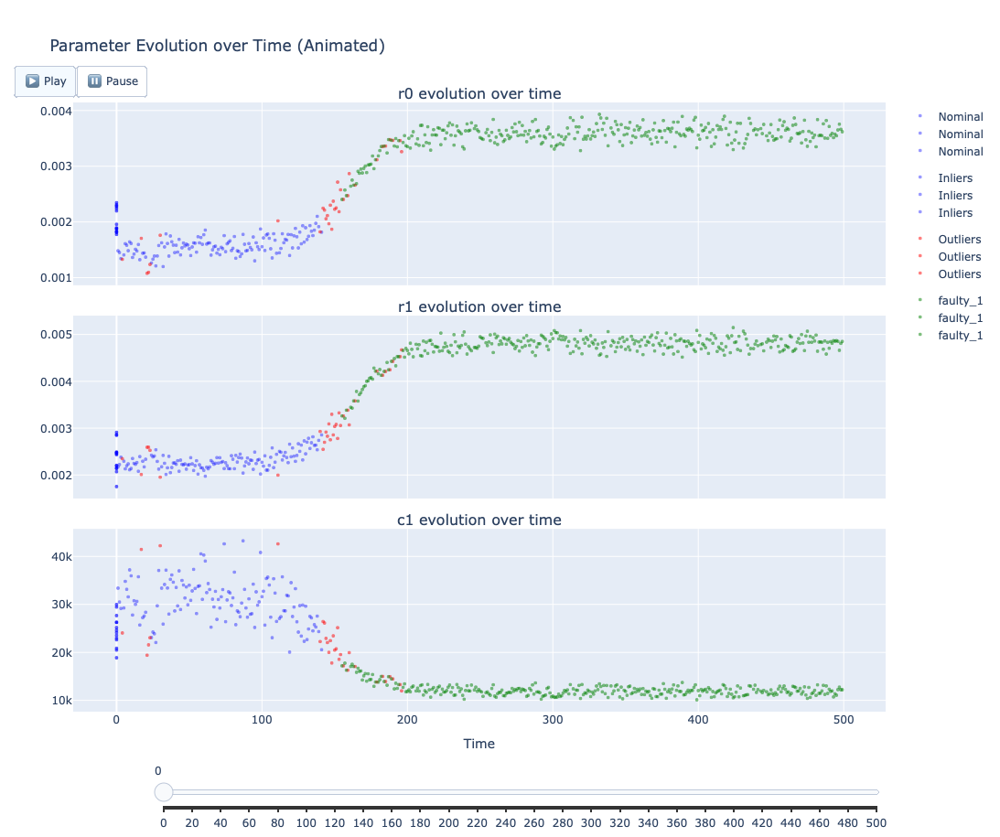

In [216]:
animated_params_vs_time(
    X=df_samples,
    params=["r0", "r1", "c1"],
    original=df_samples[df_samples['time'] == 0],
    faulty_clusters={key: df for key, df in dfs_clusters.items() if 'nominal' not in key}
)

In [108]:
dfs_clusters['faulty_4']

KeyError: 'faulty_4'

In [22]:
dfs_clusters['faulty_5']

KeyError: 'faulty_5'